<center><font size=6> 交易历史的观察 </font></center>
目前还没完成

1. 对历史价值，策略净值进行展示
2. 以图像形式展示买入点和卖出点
3. 计算收益率、胜率、最大回撤等等指标。

In [2]:
import pandas as pd
import numpy as np

import cufflinks 
cufflinks.set_config_file(offline_config=False)

In [2]:
file_path = "./data/COMPUSDT-1m-2023-07.csv"

In [363]:

# 从本地读取价量数据
binance_price_df = pd.read_csv(file_path, header=None)
binance_price_df.columns = ['open_time','open','high','low','close','volume','close_time','quote_volume','count',
                    'taker_buy_volume','taker_buy_quote_volume','ignore']

price_df = binance_price_df[['close']]

# theta
Boll_df = pd.DataFrame(index=price_df.index)
Boll_df['mean_20'] = price_df[['close']].ewm(span=20, adjust=False).mean()
Boll_df['std_20'] = price_df[['close']].ewm(span=20, adjust=False).std()
Boll_df['close'] = price_df['close']
Boll_df.dropna(inplace=True)

# 计算偏离度 theta = (p - ma) / sigma
Boll_df['theta'] = (Boll_df['close'] - Boll_df['mean_20']) / Boll_df['std_20']

In [364]:
Boll_df["UP"] = Boll_df["mean_20"] + 2 * Boll_df["std_20"]
Boll_df["LB"] = Boll_df["mean_20"] - 2 * Boll_df["std_20"]

In [483]:
Boll_df['std_20'].mean()

0.055241746048626354

## 使用vectorBT来辅助进行回测

In [158]:
import vectorbt as vbt
import numpy as np

def pandas_fill(arr):
    df = pd.DataFrame(arr)
    df.fillna(0, axis=0, inplace=True)
    out = df[0].values
    return out

In [160]:
# 计算rtn，用于止损
price_df_close = Boll_df['close'].values

rtn_value = (price_df_close - Boll_df['close'].shift(1).values) / Boll_df['close'].shift(1).values
Boll_df['rtn_1'] = pandas_fill(rtn_value)
Boll_df['rtn_1'] += 1

# 计算entries and exits
entries = Boll_df['theta']<-2
Boll_df['entries'] = entries
Boll_df['loss_limits'] = False
for entry_ind in entries[entries==True].index:
    temp_rtn = 1
    for temp_ind in range(entry_ind+1, entry_ind+20):
        temp_rtn *= Boll_df['rtn_1'][temp_ind]
        if temp_rtn <= (1-0.005):  # 计算止损点
            Boll_df['loss_limits'][temp_ind] = True
            continue

theta_limits = Boll_df['theta']>0

loss_limits = Boll_df['loss_limits']

time_limits = Boll_df['entries'].shift(50)
time_limits = time_limits.fillna(False)  # 按照时间退出

exits = np.logical_or(theta_limits.values, loss_limits.values)
exits = np.logical_or(exits,  time_limits.values)

Boll_df['time_limits'] = time_limits
Boll_df['exits']  = exits

price_df = Boll_df[['close']]

## Backtesting

In [163]:
pf = vbt.Portfolio.from_signals(price_df, Boll_df['entries'], Boll_df['exits'],)

In [164]:
pf.total_return()

close    0.040967
Name: total_return, dtype: float64

In [5]:
import numpy as np

In [7]:
can = np.load('./candidate_symbols.npy', allow_pickle=True)

In [8]:
can

array(['compusdt', 'aaveusdt', 'solusdt', 'bsvusdt', 'aptusdt', 'etcusdt',
       'ordiusdt', 'avaxusdt', 'fxsusdt', 'axsusdt', 'maskusdt',
       'tonusdt', 'filusdt', 'dydxusdt', 'revousdt', 'arbusdt', 'ldousdt',
       'yggusdt', 'xrpusdt', 'maticusdt'], dtype=object)

In [502]:
def run_bt(file_path):
    # 从本地读取价量数据
    binance_price_df = pd.read_csv(file_path, header=None)
    binance_price_df.columns = ['open_time','open','high','low','close','volume','close_time','quote_volume','count',
                        'taker_buy_volume','taker_buy_quote_volume','ignore']

    price_df = binance_price_df[['close']]

    # theta
    Boll_df = pd.DataFrame(index=price_df.index)
    Boll_df['mean_20'] = price_df[['close']].ewm(span=20, adjust=False).mean()
    Boll_df['std_20'] = price_df[['close']].ewm(span=20, adjust=False).std()
    Boll_df['close'] = price_df['close']
    Boll_df.dropna(inplace=True)
    print(file_path[7:11] + 'std mean:' + str(Boll_df['std_20'].mean()))

    # 计算偏离度 theta = (p - ma) / sigma
    Boll_df['theta'] = (Boll_df['close'] - Boll_df['mean_20']) / Boll_df['std_20']
    
    # 计算rtn，用于止损
    price_df_close = Boll_df['close'].values

    rtn_value = (price_df_close - Boll_df['close'].shift(1).values) / Boll_df['close'].shift(1).values
    Boll_df['rtn_1'] = pandas_fill(rtn_value)
    Boll_df['rtn_1'] += 1

    # 计算entries and exits
    low_entries = Boll_df['theta']<-2
    high_entries = Boll_df['theta']>2
    entries = np.logical_or(low_entries.values, high_entries.values)
    
    Boll_df['entries'] = entries
    Boll_df['loss_limits'] = False
    for entry_ind in Boll_df['entries'][entries==True].index:
        temp_rtn = 1
        for temp_ind in range(entry_ind+1, entry_ind+20):
            if temp_ind >= len(Boll_df):
                break
            temp_rtn *= Boll_df['rtn_1'][temp_ind]
            if temp_rtn <= (1-0.002):  # 计算止损点
                Boll_df['loss_limits'][temp_ind] = True
                continue

#     theta_limits = Boll_df['theta']>2

    loss_limits = Boll_df['loss_limits']

    time_limits = Boll_df['entries'].shift(50)
    time_limits = time_limits.fillna(False)  # 按照时间退出

    exits = np.logical_or(time_limits.values, loss_limits.values)
#     exits = np.logical_or(exits,  time_limits.values)

    Boll_df['time_limits'] = time_limits
    Boll_df['exits']  = exits

    return Boll_df

In [503]:
result = pd.DataFrame(index=pf.stats(column='close').index)

F:\ProgramData\Anaconda3\envs\pythonlab\lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sharpe_ratio' requires frequency to be set

F:\ProgramData\Anaconda3\envs\pythonlab\lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'calmar_ratio' requires frequency to be set

F:\ProgramData\Anaconda3\envs\pythonlab\lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'omega_ratio' requires frequency to be set

F:\ProgramData\Anaconda3\envs\pythonlab\lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sortino_ratio' requires frequency to be set



In [504]:
import os

In [505]:
file_list = os.listdir('./data')

In [506]:
file_list

['.ipynb_checkpoints',
 'AAVEUSDT-1m-2023-07.csv',
 'APTUSDT-1m-2023-07.csv',
 'COMPUSDT-1m-2023-07.csv',
 'ETCUSDT-1m-2023-07.csv',
 'SOLUSDT-1m-2023-07.csv']

ETCUstd mean:0.029201640621483373


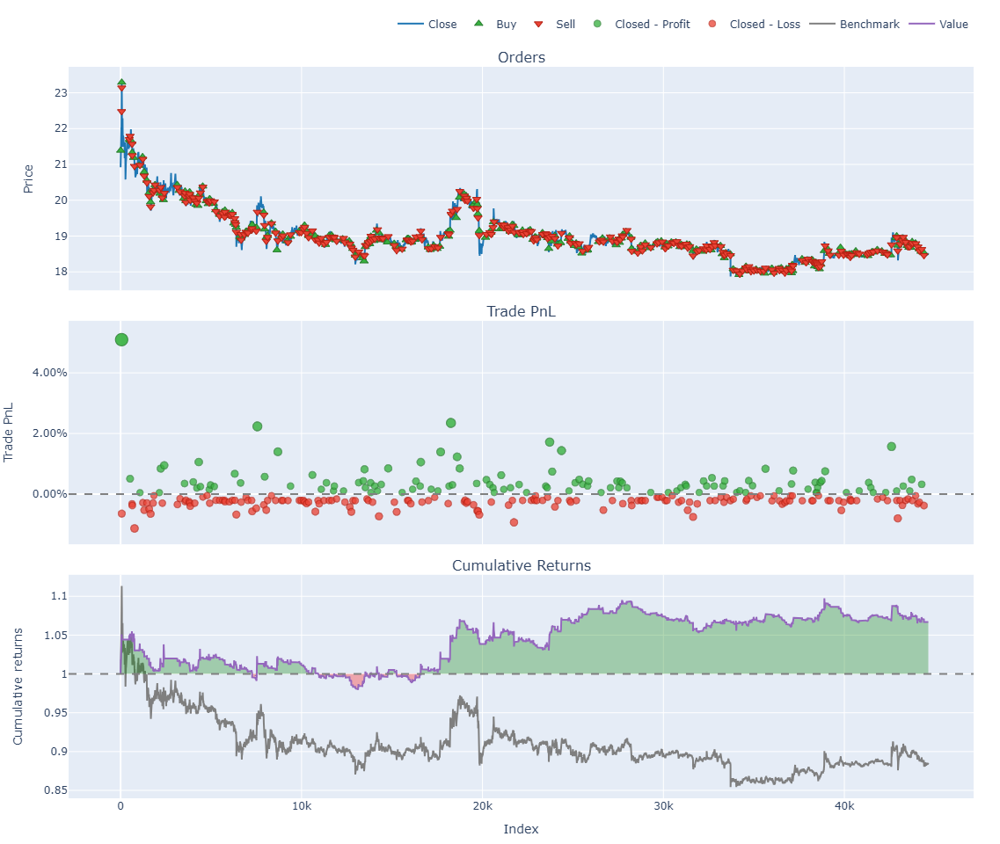

In [510]:
file_path = './data/' + file_list[4]

Boll_df = run_bt(file_path)
pf = vbt.Portfolio.from_signals(Boll_df[['close']], Boll_df['entries'], Boll_df['exits'],)
pf['close'].plot().show()

result[file_path[7:11]] = pf.stats(column='close').values

In [512]:
result

,AAVE,APTU,COMP,ETCU,SOLU
Start,1.000000,1.000000,1.000000,1.000000,1.000000
End,44639.000000,44639.000000,44639.000000,44639.000000,44639.000000
Period,44639.000000,44639.000000,44639.000000,44639.000000,44639.000000
Start Value,100.000000,100.000000,100.000000,100.000000,100.000000
End Value,108.830239,107.387001,106.563346,106.675565,92.813201
Total Return [%],8.830239,7.387001,6.563346,6.675565,-7.186799
Benchmark Return [%],-7.210788,-2.827934,18.821633,-11.567878,25.888594
Max Gross Exposure [%],100.000000,100.000000,100.000000,100.000000,100.000000
Total Fees Paid,0.000000,0.000000,0.000000,0.000000,0.000000
Max Drawdown [%],4.617918,12.085138,10.463333,7.141807,9.719558


In [9]:
class A():
    def __init__(self, x):
        self.x = x
        return


In [10]:
class B():
    def __init__(self, a):
        self.a = a
        return

In [11]:
a = A(10)

In [15]:
a.x += 1

In [16]:
a.x 

11

In [13]:
b= B(a)

In [17]:
b.a.x

11

In [4]:
def fun(ob):
    ob.x += 10
    return

In [5]:
fun(a)

In [7]:
a.x

20

In [4]:
(6.448 - 6.4706) / 6.47

-0.0034930448222565275

In [3]:
 1 - 0.002

0.998